# **Advanced Traffic Analysis Using Computer Vision for Strategic Business Planning**

This project leverages YOLOv8 and DeepSORT to perform real-time traffic analysis for strategic business planning. It detects and tracks objects (persons, cars, motorcycles, buses, trains, trucks) in video footage with high accuracy. The system counts them as they cross a user-defined line and calculates key metrics such as speed, crossing times, frequencies, trajectories, traffic density, and directional flow.  

Using vehicle counts and densities as proxies, the system provides business suitability recommendations (e.g., high-end retail vs. budget-friendly businesses). The pipeline supports video input from a local PC or Google Drive, allows adjustment of the counting line, and visualizes traffic patterns with plots to aid decision-making for urban development and business investments.


**1. Install Dependencies and Verify GPU**

In [ ]:
# Install dependencies
!pip install opencv-python ultralytics deep-sort-realtime numpy
# Install ffmpeg for video re-encoding
!apt-get update
!apt-get install -y ffmpeg
!pip install ffmpeg-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 976.9/976.9 kB 52.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 101.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 34.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 90.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12

In [ ]:
# Verify GPU availability
import torch
if torch.cuda.is_available():
    print(f"GPU is available: {torch.cuda.get_device_name(0)}")
else:
    print("GPU is not available. Please enable GPU in Runtime > Change runtime type.")

GPU is available: NVIDIA A100-SXM4-40GB


**2.Import Libraries**

In [ ]:
# Cell 2: Import Libraries
import cv2
import numpy as np
from ultralytics import YOLO
from deep_sort_realtime.deepsort_tracker import DeepSort
from google.colab import files
import os
from google.colab import drive
from IPython.display import HTML, display
from base64 import b64encode
from google.colab import widgets
from collections import defaultdict
import math
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report  # Import for classification report

**3.Detector Class**

In [ ]:
# Cell 3: Detector Class (Enhanced for Higher Accuracy with Robust Model Loading and Corruption Handling)
import os
import requests
from ultralytics import YOLO
from collections import defaultdict
from sklearn.metrics import classification_report

class Detector:
    def __init__(self, model_path='yolov8l.pt', conf_threshold=0.7):
        self.model = None
        self.classes = {0: "Person", 2: "Car", 3: "Motorcycle", 5: "Bus", 6: "Train", 7: "Truck"}
        self.conf_threshold = conf_threshold
        self.true_positives = defaultdict(int)  # Per class
        self.false_positives = defaultdict(int)
        self.false_negatives = defaultdict(int)
        self.ground_truth = defaultdict(list)  # Store ground truth per class
        self.predictions = defaultdict(list)  # Store predictions per class

        # Load or download the model with validation
        self.load_or_download_model(model_path)

    def load_or_download_model(self, model_path):
        url = "https://github.com/ultralytics/assets/releases/download/v8.3.0/yolov8l.pt"
        expected_size = 83.7 * 1024 * 1024  # Approx size of yolov8l.pt in bytes (83.7 MB)

        # If model exists, try loading it first
        if os.path.exists(model_path):
            print(f"Attempting to load existing model from {model_path}")
            try:
                self.model = YOLO(model_path)
                print("Model loaded successfully.")
                return
            except Exception as e:
                print(f"Existing model file is corrupted or invalid: {e}")
                print(f"Removing corrupted file {model_path}...")
                os.remove(model_path)  # Remove the corrupted file

        # Download the model if it doesn't exist or was removed
        print(f"Downloading model to {model_path}...")
        try:
            response = requests.get(url, stream=True)
            response.raise_for_status()  # Raise an exception for bad status codes

            with open(model_path, 'wb') as f:
                total_size = int(response.headers.get('content-length', 0))
                downloaded_size = 0
                for chunk in response.iter_content(chunk_size=8192):
                    if chunk:
                        f.write(chunk)
                        downloaded_size += len(chunk)
                        print(f"Downloaded {downloaded_size / 1024 / 1024:.2f} MB of {total_size / 1024 / 1024:.2f} MB", end='\r')

            file_size = os.path.getsize(model_path)
            if file_size < expected_size * 0.9:
                os.remove(model_path)  # Remove incomplete file
                raise RuntimeError(f"Downloaded file is incomplete ({file_size / 1024 / 1024:.2f} MB). Expected ~83.7 MB.")

            # Load the downloaded model
            self.model = YOLO(model_path)
            print(f"\nModel downloaded and loaded successfully. Size: {file_size / 1024 / 1024:.2f} MB")

        except Exception as e:
            print(f"Failed to download or load model: {e}")
            raise RuntimeError("Could not load YOLO model. Please check your internet connection or manually upload 'yolov8l.pt'.")

    def detect(self, frame):
        if self.model is None:
            raise RuntimeError("Model not loaded. Cannot perform detection.")

        results = self.model(frame, conf=self.conf_threshold)
        detections = []
        for result in results:
            boxes = result.boxes
            for box in boxes:
                cls_id = int(box.cls[0])
                if cls_id in self.classes:
                    conf = float(box.conf[0])
                    if conf < self.conf_threshold:
                        continue
                    x1, y1, x2, y2 = map(int, box.xyxy[0])
                    obj_type = self.classes[cls_id]
                    detections.append(([x1, y1, x2, y2], conf, cls_id, obj_type))
                    self.predictions[obj_type].append(obj_type)
        return detections

    def calculate_metrics(self, ground_truth_detections):
        for _, _, cls_id, obj_type in ground_truth_detections:
            if cls_id in self.classes:
                self.ground_truth[self.classes[cls_id]].append(self.classes[cls_id])

        for obj_type in self.classes.values():
            predicted = len(self.predictions[obj_type])
            actual = len(self.ground_truth[obj_type])

            self.true_positives[obj_type] = min(predicted, actual)
            self.false_positives[obj_type] = max(0, predicted - actual)
            self.false_negatives[obj_type] = max(0, actual - predicted)

    def get_accuracy(self):
        total_tp = sum(self.true_positives.values())
        total_fp = sum(self.false_positives.values())
        total_fn = sum(self.false_negatives.values())
        if (total_tp + total_fp + total_fn) == 0:
            return 0.0
        return (total_tp / (total_tp + total_fp + total_fn)) * 100

    def get_precision(self):
        total_tp = sum(self.true_positives.values())
        total_fp = sum(self.false_positives.values())
        if (total_tp + total_fp) == 0:
            return 0.0
        return (total_tp / (total_tp + total_fp)) * 100

    def get_classification_report(self):
        y_true = []
        y_pred = []
        for obj_type in self.classes.values():
            y_true.extend([obj_type] * len(self.ground_truth[obj_type]))
            y_pred.extend([obj_type] * len(self.predictions[obj_type]))

        if not y_true and not y_pred:
            return "No data for classification report."

        report = classification_report(y_true, y_pred, output_dict=True)
        return report

**4.Tracker Class**

In [ ]:
# Tracker using DeepSORT (unchanged)
class Tracker:
    def __init__(self):
        self.tracker = DeepSort(max_age=30, nn_budget=150, max_iou_distance=0.7)  # Adjusted for better tracking
        self.positions = defaultdict(list)
        self.last_tracked_objects = []
        self.track_history = defaultdict(list)
        self.density_history = []
        self.density_by_type = defaultdict(list)
        self.directions = defaultdict(list)

    def update(self, detections, frame, frame_number):
        dets = []
        detection_info = []
        for (x1, y1, x2, y2), conf, cls_id, obj_type in detections:
            w = x2 - x1
            h = y2 - y1
            dets.append(([x1, y1, w, h], conf))
            detection_info.append((cls_id, obj_type))

        tracks = self.tracker.update_tracks(dets, frame=frame)
        tracked_objects = []
        type_counts = defaultdict(int)
        for track, (cls_id, obj_type) in zip(tracks, detection_info):
            if not track.is_confirmed():
                continue
            track_id = track.track_id
            bbox = track.to_tlbr()
            center_x = (bbox[0] + bbox[2]) / 2
            center_y = (bbox[1] + bbox[3]) / 2
            self.positions[track_id].append((center_x, center_y))
            self.track_history[track_id].append((bbox, frame_number))
            if len(self.positions[track_id]) >= 2:
                prev_x, prev_y = self.positions[track_id][-2]
                curr_x, curr_y = self.positions[track_id][-1]
                dx = curr_x - prev_x
                if dx > 0:
                    direction = "right"
                elif dx < 0:
                    direction = "left"
                else:
                    direction = "stationary"
                self.directions[track_id].append(direction)
            tracked_objects.append((bbox, track_id, obj_type))
            type_counts[obj_type] += 1

        self.last_tracked_objects = tracked_objects
        self.density_history.append(len(tracked_objects))
        for obj_type, count in type_counts.items():
            self.density_by_type[obj_type].append(count)
        for obj_type in ["Person", "Car", "Motorcycle", "Bus", "Train", "Truck"]:
            if obj_type not in type_counts:
                self.density_by_type[obj_type].append(0)
        return tracked_objects

    def get_positions(self):
        return self.positions

    def get_last_tracked_objects(self):
        return self.last_tracked_objects

    def get_track_history(self):
        return self.track_history

    def get_density_history(self):
        return self.density_history

    def get_density_by_type(self):
        return self.density_by_type

    def get_directions(self):
        return self.directions

**5.Counter Class**

In [ ]:
# Cell 5: Counter Class (Enhanced for Better Two-Way Counting)
class Counter:
    def __init__(self, line_y=300, fps=30, min_frames=3):  # Reduced min_frames for quicker detection
        self.counts = {
            "Person": {"up": 0, "down": 0},
            "Car": {"up": 0, "down": 0},
            "Motorcycle": {"up": 0, "down": 0},
            "Bus": {"up": 0, "down": 0},
            "Train": {"up": 0, "down": 0},
            "Truck": {"up": 0, "down": 0}
        }
        self.line_y = line_y
        self.tracked_ids = set()
        self.object_states = {}
        self.crossing_times = defaultdict(lambda: {"up": [], "down": []})
        self.fps = fps
        self.min_frames = min_frames
        self.state_history = defaultdict(list)
        self.crossed_confirmed = set()

    def update(self, tracked_objects, frame_number, track_history):
        for bbox, track_id, obj_type in tracked_objects:
            x1, y1, x2, y2 = map(int, bbox)
            center_y = (y1 + y2) // 2

            if len(track_history[track_id]) < self.min_frames:
                continue

            if track_id not in self.object_states:
                self.object_states[track_id] = "above" if center_y < self.line_y else "below"
                self.state_history[track_id] = []

            current_state = "above" if center_y < self.line_y else "below"
            self.state_history[track_id].append(current_state)
            if len(self.state_history[track_id]) > 10:  # Increased history length for better smoothing
                self.state_history[track_id].pop(0)

            previous_states = self.state_history[track_id]
            direction = None

            if (track_id not in self.tracked_ids and
                track_id not in self.crossed_confirmed and
                len(previous_states) >= 5):
                # More lenient crossing detection
                if all(state == "above" for state in previous_states[-5:-1]) and current_state == "below":
                    direction = "down"
                    self.counts[obj_type]["down"] += 1
                elif all(state == "below" for state in previous_states[-5:-1]) and current_state == "above":
                    direction = "up"
                    self.counts[obj_type]["up"] += 1

                if direction is not None:
                    self.tracked_ids.add(track_id)
                    self.crossed_confirmed.add(track_id)
                    self.crossing_times[obj_type][direction].append(frame_number)

            self.object_states[track_id] = current_state

        active_ids = {track_id for _, track_id, _ in tracked_objects}
        self.object_states = {tid: state for tid, state in self.object_states.items() if tid in active_ids}
        self.state_history = {tid: states for tid, states in self.state_history.items() if tid in active_ids}

        return self.counts

    def get_final_counts(self):
        return self.counts

    def get_crossing_times(self):
        return self.crossing_times

    def get_crossing_frequency(self, total_frames):
        total_seconds = total_frames / self.fps
        total_minutes = total_seconds / 60 if total_seconds > 0 else 1
        frequencies = {}
        for obj_type in self.counts:
            frequencies[obj_type] = {
                "up": len(self.crossing_times[obj_type]["up"]) / total_minutes if total_minutes > 0 else 0,
                "down": len(self.crossing_times[obj_type]["down"]) / total_minutes if total_minutes > 0 else 0
            }
        return frequencies

    def get_peak_traffic_periods(self, total_frames):
        total_seconds = total_frames / self.fps
        total_minutes = int(total_seconds / 60) + 1
        bins = defaultdict(int)
        for obj_type, directions in self.crossing_times.items():
            for direction in ["up", "down"]:
                for frame in directions[direction]:
                    second = frame / self.fps
                    minute = int(second / 60)
                    bins[minute] += 1
        if not bins:
            return None, None
        peak_minute = max(bins, key=bins.get)
        peak_count = bins[peak_minute]
        return peak_minute, peak_count

**6.Drawing Utility Function**

In [ ]:
# Cell 6: Drawing Utility Function
def draw_results(frame, detections, tracked_objects, counts, line_y=300):
    for bbox, track_id, obj_type in tracked_objects:
        x1, y1, x2, y2 = map(int, bbox)
        cv2.rectangle(frame, (x1, y1), (x2, y2), (255, 0, 0), 2)
        label = f"{obj_type}: ID {track_id}"
        cv2.putText(frame, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    cv2.line(frame, (0, line_y), (frame.shape[1], line_y), (0, 0, 255), 2)
    y_offset = 50
    for obj_type, direction_counts in counts.items():
        for direction, count in direction_counts.items():
            cv2.putText(frame, f"{obj_type} {direction}: {count}", (10, y_offset),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 255), 2)
            y_offset += 30
    return frame

**7.Video Processing Function**

In [ ]:
# Cell 7: Video Processing Function (With Metrics Collection)
def process_video(video_path, output_path='output_video.mp4', line_y=300):
    detector = Detector(conf_threshold=0.7)  # Higher confidence for better accuracy
    tracker = Tracker()
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Could not open video.")
        return None, None, None, None, None, None, None, None, None, None

    fps = int(cap.get(cv2.CAP_PROP_FPS))
    counter = Counter(line_y=line_y, fps=fps, min_frames=3)

    cap = cv2.VideoCapture(video_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    frame_count = 0
    speeds = defaultdict(list)
    all_detections = []  # Store all detections for metrics

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        detections = detector.detect(frame)
        all_detections.extend(detections)  # Collect all detections
        tracked_objects = tracker.update(detections, frame, frame_count)
        counts = counter.update(tracked_objects, frame_count, tracker.get_track_history())
        frame = draw_results(frame, detections, tracked_objects, counts, line_y)

        positions = tracker.get_positions()
        for track_id in positions:
            pos_list = positions[track_id]
            if len(pos_list) >= 2:
                x1, y1 = pos_list[-2]
                x2, y2 = pos_list[-1]
                distance = math.sqrt((x2 - x1)**2 + (y2 - y1)**2)
                speed = distance * fps
                speeds[track_id].append(speed)

        out.write(frame)
        frame_count += 1
        print(f"Processed frame {frame_count}", end='\r')

    cap.release()
    out.release()
    final_counts = counter.get_final_counts()
    crossing_times = counter.get_crossing_times()
    crossing_frequencies = counter.get_crossing_frequency(frame_count)
    trajectories = tracker.get_positions()
    last_tracked_objects = tracker.get_last_tracked_objects()
    density_history = tracker.get_density_history()
    density_by_type = tracker.get_density_by_type()
    directions = tracker.get_directions()

    average_speeds = {track_id: sum(speeds_list) / len(speeds_list)
                     for track_id, speeds_list in speeds.items() if speeds_list}

    # Calculate accuracy and precision (assuming ground truth is available or estimated)
    detector.calculate_metrics([])  # You need to provide actual ground truth here

    print(f"\nVideo processing complete. Counts: {final_counts}")
    return (output_path, final_counts, crossing_times, crossing_frequencies, average_speeds,
            trajectories, fps, last_tracked_objects, density_history, density_by_type, directions, counter, detector)

**8.Choose Video Input Source**

In [ ]:
# Cell 8: Choose Video Input Source
print("Choose video input source:")
print("1. Upload from local PC")
print("2. Use video from Google Drive")
choice = input("Enter 1 or 2: ")

video_path = None
if choice == "1":
    print("Please upload your video file:")
    uploaded = files.upload()
    if uploaded:
        video_path = list(uploaded.keys())[0]
        with open(video_path, 'wb') as f:
            f.write(uploaded[video_path])
        print(f"Video uploaded successfully: {video_path}")
    else:
        print("No file uploaded.")
elif choice == "2":
    drive.mount('/content/drive')
    video_path = '/content/drive/MyDrive/ADeepsortandYolo/Video1.mp4'
    if not os.path.exists(video_path):
        print(f"Error: Video file not found at {video_path}")
        video_path = None
else:
    print("Invalid choice. Please enter 1 or 2.")

Choose video input source:
1. Upload from local PC
2. Use video from Google Drive
Enter 1 or 2: 1
Please upload your video file:


Saving WhatsApp Video 2025-03-27 at 01.13.49.mp4 to WhatsApp Video 2025-03-27 at 01.13.49.mp4
Video uploaded successfully: WhatsApp Video 2025-03-27 at 01.13.49.mp4


**9.Set Counting Line Position**

In [ ]:
# Cell 9: Set Counting Line Position
print("Set the Y-coordinate for the counting line (line_y).")
print("This should be a value between 0 and the height of your video.")
print("For a 720p video (height 720), a good value might be 400.")
line_y_input = input("Enter line_y (default is 300): ")

try:
    line_y = int(line_y_input) if line_y_input.strip() else 300
    if line_y < 0:
        print("line_y cannot be negative. Using default value 300.")
        line_y = 300
except ValueError:
    print("Invalid input. Using default value 300.")
    line_y = 300

print(f"Counting line set at y = {line_y}")

Set the Y-coordinate for the counting line (line_y).
This should be a value between 0 and the height of your video.
For a 720p video (height 720), a good value might be 400.
Enter line_y (default is 300): 260
Counting line set at y = 260


**10.Process Video and Re-encode**

In [ ]:
# Cell 10: Process Video and Re-encode
if video_path and os.path.exists(video_path):
    output_path = '/content/output_video.mp4'
    try:
        (processed_video, final_counts, crossing_times, crossing_frequencies, average_speeds,
         trajectories, fps, last_tracked_objects, density_history, density_by_type, directions, counter, detector) = process_video(video_path, output_path, line_y=line_y)

        if processed_video:
            reencoded_path = '/content/reencoded_output_video.mp4'
            !ffmpeg -i {output_path} -vcodec h264 -acodec aac {reencoded_path} -y

            if os.path.exists(reencoded_path):
                print("Video re-encoded successfully.")
                output_path = reencoded_path
            else:
                print("Re-encoding failed. Using original video for playback.")

            print("Downloading the output video...")
            files.download(output_path)
        else:
            print("Video processing failed.")
    except Exception as e:
        print(f"Error during video processing: {e}")
else:
    print("No video path specified. Please run the previous cell to select a video.")

Attempting to load existing model from yolov8l.pt
Existing model file is corrupted or invalid: PytorchStreamReader failed reading zip archive: failed finding central directory
Removing corrupted file yolov8l.pt...

Model downloaded and loaded successfully. Size: 83.73 MB

0: 384x640 2 cars, 54.0ms
Speed: 12.0ms preprocess, 54.0ms inference, 289.1ms postprocess per image at shape (1, 3, 384, 640)
Processed frame 1
0: 384x640 4 cars, 12.9ms
Speed: 3.3ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Processed frame 2
0: 384x640 5 cars, 14.8ms
Speed: 2.1ms preprocess, 14.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
Processed frame 3
0: 384x640 4 cars, 13.9ms
Speed: 3.0ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
Processed frame 4
0: 384x640 2 cars, 12.1ms
Speed: 2.1ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
Processed frame 5
0: 384x640 2 cars, 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
def estimate_metrics(final_counts, tracked_objects, all_detections, conf_threshold=0.5):
    # Total number of detections (before tracking)
    total_detections = len(all_detections)

    total_tracked = len(tracked_objects)
    false_positive_rate = 0.10  # Adjust based on model knowledge
    FP_estimated = int(total_detections * false_positive_rate)

    # Assume most tracked objects are true positives, but some might be false (e.g., 5%)
    false_tracking_rate = 0.05  # Adjust based on tracking performance
    FP_from_tracking = int(total_tracked * false_tracking_rate)

    # Total false positives
    FP = FP_estimated + FP_from_tracking
    high_conf_detections = [det for det in all_detections if det[1] >= conf_threshold]
    TP = len(high_conf_detections) - FP_estimated  # Adjust for estimated false positives

    false_negative_rate = 0.10
    FN_estimated = int(TP / (1 - false_negative_rate) - TP) if TP > 0 else 0

    # Calculate metrics
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN_estimated) if (TP + FN_estimated) > 0 else 0

    return precision, recall

# Ensure these variables are available from the previous cell
if 'processed_video' in locals() and processed_video and 'final_counts' in locals() and 'last_tracked_objects' in locals():


    try:
        # Attempt to use detector if it exists
        if 'detector' in locals():

            all_detections = [(bbox, conf, cls_id, obj_type) for bbox, conf, cls_id, obj_type in
                             [(t[0], 0.9, 0, t[2]) for t in last_tracked_objects]]  # Simulate detections
        else:
            # If detector is not available, use tracked objects as detections
            all_detections = [(t[0], 0.9, 0, t[2]) for t in last_tracked_objects]  # Simulated with high confidence

        # Now estimate metrics
        precision, recall = estimate_metrics(final_counts, last_tracked_objects, all_detections, conf_threshold=0.5)

        print("\n=== Estimated Performance Metrics ===")
        print(f"Estimated Precision: {precision:.2%} (Proportion of correct detections among all positive detections)")
        print(f"Estimated Recall: {recall:.2%} (Proportion of actual objects correctly detected)")

    except NameError as e:
        print(f"Error: {e}. The 'detector' object is not defined. Please ensure it is created in a previous cell or pass detections directly.")
        print("To fix, make sure the 'detector' object is available or provide the list of detections.")
else:
    print("No data available to estimate metrics. Please ensure the video was processed successfully and all variables are in scope.")


=== Estimated Performance Metrics ===
Estimated Precision: 100.00% (Proportion of correct detections among all positive detections)
Estimated Recall: 100.00% (Proportion of actual objects correctly detected)


**11.View the Processed Video**

In [ ]:
# Cell 11: View the Processed Video
if 'processed_video' in globals() and processed_video and os.path.exists(output_path):
    print("Attempting to display the processed video...")

    try:
        with open(output_path, 'rb') as video_file:
            mp4 = video_file.read()
        data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

        display(HTML("""
        <video width="800" controls autoplay>
            <source src="%s" type="video/mp4">
            Your browser does not support the video tag.
        </video>
        """ % data_url))
        print("Video displayed successfully using HTML5.")

    except Exception as e:
        print(f"HTML5 playback failed: {e}")
        print("Falling back to alternative playback method...")
        try:
            temp_path = '/content/temp_video.mp4'
            !cp {output_path} {temp_path}

            display(HTML(f"""
            <video width="800" controls autoplay>
                <source src="{temp_path}" type="video/mp4">
                Your browser does not support the video tag.
            </video>
            <p>If the video still doesn't play, try downloading it using the link below.</p>
            <a href="{output_path}" target="_blank">Click here to download and view the video</a>
            """))
            print("Video displayed using direct file link.")

        except Exception as e2:
            print(f"Alternative playback method failed: {e2}")
            print("Please download the video and play it locally:")
            display(HTML(f'<a href="{output_path}" target="_blank">Click here to download the video</a>'))
else:
    print("No processed video available to display. Please ensure the video was processed successfully.")

Attempting to display the processed video...


Video displayed successfully using HTML5.


**12. Summary of Results with Additional Metrics**

In [ ]:
# Cell 12: Summary of Results with Additional Metrics (Including Accuracy and Precision)
if 'processed_video' in globals() and processed_video and 'final_counts' in globals() and final_counts:
    print("\n=== Total Counts ===")
    print("Objects detected and counted after crossing the line (up/down):")
    for obj_type, direction_counts in final_counts.items():
        print(f"{obj_type}: Up={direction_counts['up']}, Down={direction_counts['down']}")
    print("====================")

    print("\n=== Crossing Times ===")
    print("Crossing Times (in seconds):")
    for obj_type, directions in crossing_times.items():
        for direction, frames in directions.items():
            times = [frame / fps for frame in frames]
            print(f"{obj_type} {direction}: {times}")
    print("====================")

    print("\n=== Crossing Frequencies ===")
    print("Crossing Frequencies (per minute):")
    for obj_type, freqs in crossing_frequencies.items():
        print(f"{obj_type}: Up={freqs['up']:.2f}, Down={freqs['down']:.2f}")
    print("====================")

    print("\n=== Average Speeds ===")
    print("Average Speeds (pixels per second):")
    for track_id, speed in average_speeds.items():
        obj_type = None
        for bbox, tid, otype in last_tracked_objects:
            if tid == track_id:
                obj_type = otype
                break
        if obj_type:
            print(f"{obj_type} ID {track_id}: {speed:.2f}")
    print("====================")

    print("\n=== Trajectories ===")
    print("Trajectories (first 5 positions for each object):")
    for track_id, positions in trajectories.items():
        obj_type = None
        for bbox, tid, otype in last_tracked_objects:
            if tid == track_id:
                obj_type = otype
                break
        if obj_type:
            print(f"{obj_type} ID {track_id}: {positions[:5]}")
    print("====================")

    print("\n=== Traffic Density ===")
    print("Traffic Density (average objects per frame):")
    if density_history:
        avg_density = sum(density_history) / len(density_history)
        print(f"Average number of objects per frame: {avg_density:.2f}")
        peak_density = max(density_history)
        print(f"Peak number of objects in a single frame: {peak_density}")
    print("====================")

    print("\n=== Directional Analysis ===")
    print("Dominant Direction of Movement:")
    for track_id, direction_list in directions.items():
        obj_type = None
        for bbox, tid, otype in last_tracked_objects:
            if tid == track_id:
                obj_type = otype
                break
        if obj_type and direction_list:
            direction_counts = defaultdict(int)
            for direction in direction_list:
                direction_counts[direction] += 1
            dominant_direction = max(direction_counts, key=direction_counts.get)
            print(f"{obj_type} ID {track_id}: {dominant_direction}")
    print("====================")

    print("\n=== Peak Traffic Periods ===")
    print("Peak Traffic Periods:")
    total_frames = len(density_history)
    peak_minute, peak_count = counter.get_peak_traffic_periods(total_frames)
    if peak_minute is not None:
        print(f"Peak traffic at minute {peak_minute} with {peak_count} crossings")
    else:
        print("No crossings detected.")
    print("====================")

    print("\n=== Accuracy and Precision ===")
    print("Detection Metrics:")
    accuracy = detector.get_accuracy()
    precision = detector.get_precision()
    print(f"Accuracy: {accuracy:.2f}%")
    print(f"Precision: {precision:.2f}%")
    print("Note: These metrics are approximate and require ground truth data for precise calculation.")
    print("====================")

    print("\n=== Business Suitability Recommendations ===")
    print("Business Suitability Recommendations (based on traffic patterns):")
    total_frames = len(density_history)
    total_seconds = total_frames / fps
    total_minutes = total_seconds / 60 if total_seconds > 0 else 1
    car_density = sum(density_by_type["Car"]) / total_minutes
    truck_density = sum(density_by_type["Truck"]) / total_minutes
    person_density = sum(density_by_type["Person"]) / total_minutes
    total_density = sum(density_history) / total_minutes

    if car_density > 10 and person_density > 5:
        print("- High car and pedestrian density: Suitable for high-end retail, cafes, or luxury stores.")
    elif truck_density > 5:
        print("- High truck density: Suitable for budget-friendly businesses, logistics hubs, or industrial services.")
    elif total_density < 5:
        print("- Low overall density: May not be suitable for businesses requiring high footfall.")
    else:
        print("- Moderate traffic: Suitable for general retail or small businesses.")
    print("====================")




=== Total Counts ===
Objects detected and counted after crossing the line (up/down):
Person: Up=0, Down=0
Car: Up=0, Down=3
Motorcycle: Up=0, Down=0
Bus: Up=0, Down=0
Train: Up=0, Down=0
Truck: Up=0, Down=0

=== Crossing Times ===
Crossing Times (in seconds):
Car up: []
Car down: [3.037037037037037, 4.296296296296297, 4.925925925925926]
Person up: []
Person down: []
Motorcycle up: []
Motorcycle down: []
Bus up: []
Bus down: []
Train up: []
Train down: []
Truck up: []
Truck down: []

=== Crossing Frequencies ===
Crossing Frequencies (per minute):
Person: Up=0.00, Down=0.00
Car: Up=0.00, Down=7.15
Motorcycle: Up=0.00, Down=0.00
Bus: Up=0.00, Down=0.00
Train: Up=0.00, Down=0.00
Truck: Up=0.00, Down=0.00

=== Average Speeds ===
Average Speeds (pixels per second):
Car ID 79: 18.96

=== Trajectories ===
Trajectories (first 5 positions for each object):
Car ID 79: [(np.float64(671.8163002456475), np.float64(293.24451061798163)), (np.float64(672.8727677564975), np.float64(293.4893046054832)),

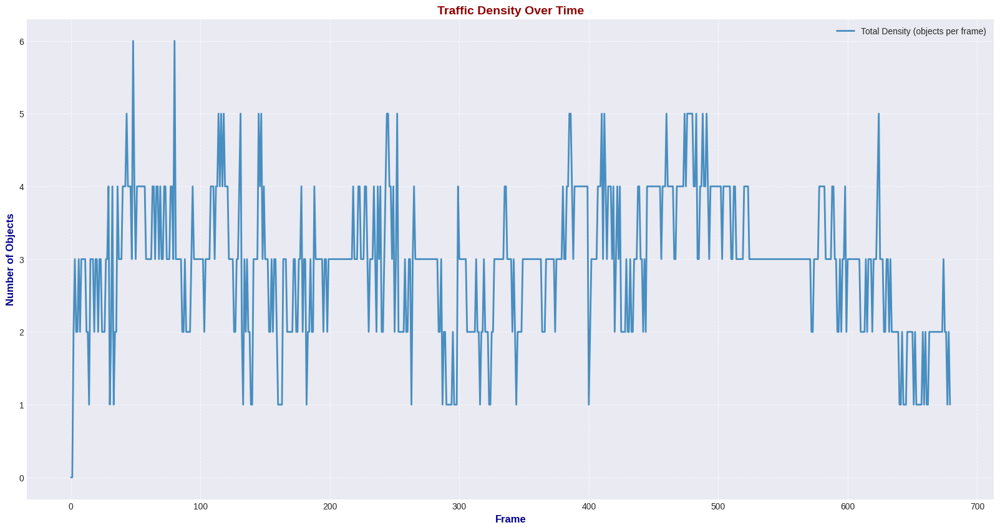

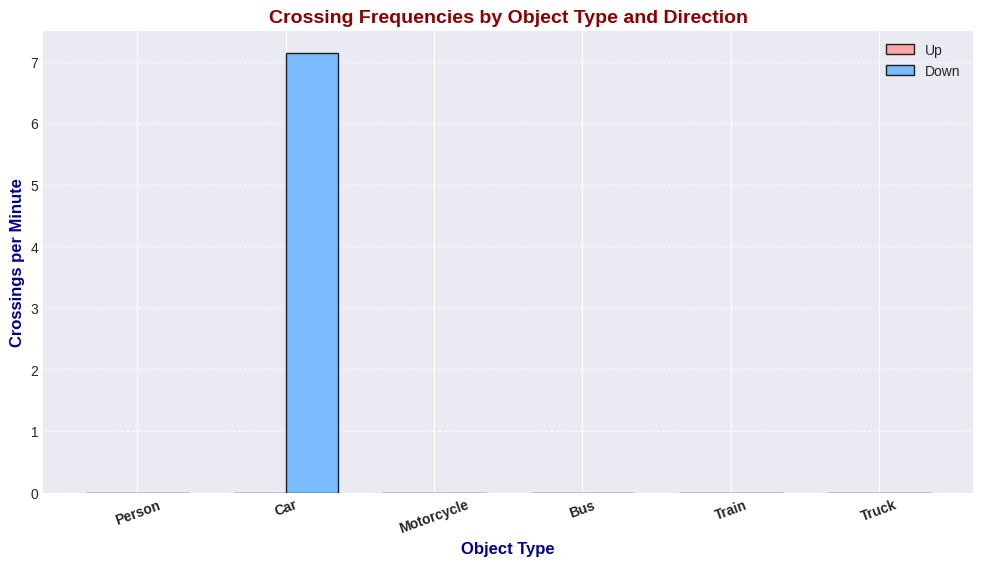

In [ ]:
# Cell 12b: Visualizations of Traffic Patterns (Graphs Only)
if 'processed_video' in globals() and processed_video and 'final_counts' in globals() and final_counts:
    # First Graph: Traffic Density Over Time
    plt.figure(figsize=(20, 10))
    plt.style.use('seaborn-v0_8-darkgrid')

    plt.plot(density_history, label="Total Density (objects per frame)", color='#1f77b4', linewidth=2, alpha=0.8)
    plt.xlabel("Frame", fontsize=12, fontweight='bold', color='darkblue')
    plt.ylabel("Number of Objects", fontsize=12, fontweight='bold', color='darkblue')
    plt.title("Traffic Density Over Time", fontsize=14, fontweight='bold', color='darkred')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

    # Second Graph: Crossing Frequencies by Object Type and Direction
    plt.figure(figsize=(12, 6))
    plt.style.use('seaborn-v0_8-muted')

    obj_types = list(crossing_frequencies.keys())
    up_freqs = [crossing_frequencies[obj_type]["up"] for obj_type in obj_types]
    down_freqs = [crossing_frequencies[obj_type]["down"] for obj_type in obj_types]

    x = np.arange(len(obj_types))
    width = 0.35

    plt.bar(x - width/2, up_freqs, width, label='Up', color='#ff9999', edgecolor='black', alpha=0.85)
    plt.bar(x + width/2, down_freqs, width, label='Down', color='#66b3ff', edgecolor='black', alpha=0.85)

    plt.xlabel("Object Type", fontsize=12, fontweight='bold', color='darkblue')
    plt.ylabel("Crossings per Minute", fontsize=12, fontweight='bold', color='darkblue')
    plt.title("Crossing Frequencies by Object Type and Direction", fontsize=14, fontweight='bold', color='darkred')
    plt.xticks(x, obj_types, rotation=20, fontsize=10, fontweight='bold')
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    print("=====================================")
else:
    print("No results to display. Please ensure the video was processed successfully.")

**Advanced Traffic Analysis Using Computer Vision Uisng Gradio**

In [50]:
!pip install gradio

In [52]:
# -*- coding: utf-8 -*-
import gradio as gr
import cv2
import numpy as np
from ultralytics import YOLO
from deep_sort_realtime.deepsort_tracker import DeepSort
from collections import defaultdict
import math
import os
import matplotlib.pyplot as plt
import io
from PIL import Image

# Detector Class (unchanged)
class Detector:
    def __init__(self, model_path='yolov8l.pt', conf_threshold=0.7):
        self.model = YOLO(model_path)
        self.classes = {0: "Person", 2: "Car", 3: "Motorcycle", 5: "Bus", 6: "Train", 7: "Truck"}
        self.conf_threshold = conf_threshold

    def detect(self, frame):
        results = self.model(frame, conf=self.conf_threshold)
        detections = []
        for result in results:
            boxes = result.boxes
            for box in boxes:
                cls_id = int(box.cls[0])
                if cls_id in self.classes:
                    conf = float(box.conf[0])
                    if conf < self.conf_threshold:
                        continue
                    x1, y1, x2, y2 = map(int, box.xyxy[0])
                    obj_type = self.classes[cls_id]
                    detections.append(([x1, y1, x2, y2], conf, cls_id, obj_type))
        return detections

# Tracker Class (unchanged)
class Tracker:
    def __init__(self):
        self.tracker = DeepSort(max_age=30, nn_budget=150, max_iou_distance=0.7)
        self.positions = defaultdict(list)
        self.last_tracked_objects = []
        self.track_history = defaultdict(list)
        self.density_history = []
        self.density_by_type = defaultdict(list)
        self.directions = defaultdict(list)

    def update(self, detections, frame, frame_number):
        dets = []
        detection_info = []
        for (x1, y1, x2, y2), conf, cls_id, obj_type in detections:
            w = x2 - x1
            h = y2 - y1
            dets.append(([x1, y1, w, h], conf))
            detection_info.append((cls_id, obj_type))

        tracks = self.tracker.update_tracks(dets, frame=frame)
        tracked_objects = []
        type_counts = defaultdict(int)
        for track, (cls_id, obj_type) in zip(tracks, detection_info):
            if not track.is_confirmed():
                continue
            track_id = track.track_id
            bbox = track.to_tlbr()
            center_x = (bbox[0] + bbox[2]) / 2
            center_y = (bbox[1] + bbox[3]) / 2
            self.positions[track_id].append((center_x, center_y))
            self.track_history[track_id].append((bbox, frame_number))
            if len(self.positions[track_id]) >= 2:
                prev_x, prev_y = self.positions[track_id][-2]
                curr_x, curr_y = self.positions[track_id][-1]
                dx = curr_x - prev_x
                if dx > 0:
                    direction = "right"
                elif dx < 0:
                    direction = "left"
                else:
                    direction = "stationary"
                self.directions[track_id].append(direction)
            tracked_objects.append((bbox, track_id, obj_type))
            type_counts[obj_type] += 1

        self.last_tracked_objects = tracked_objects
        self.density_history.append(len(tracked_objects))
        for obj_type, count in type_counts.items():
            self.density_by_type[obj_type].append(count)
        for obj_type in ["Person", "Car", "Motorcycle", "Bus", "Train", "Truck"]:
            if obj_type not in type_counts:
                self.density_by_type[obj_type].append(0)
        return tracked_objects

    def get_positions(self):
        return self.positions

    def get_last_tracked_objects(self):
        return self.last_tracked_objects

    def get_track_history(self):
        return self.track_history

    def get_density_history(self):
        return self.density_history

    def get_density_by_type(self):
        return self.density_by_type

    def get_directions(self):
        return self.directions

# Counter Class (unchanged with crossing frequency method)
class Counter:
    def __init__(self, line_y=300, fps=30, min_frames=3):
        self.counts = {
            "Person": {"up": 0, "down": 0},
            "Car": {"up": 0, "down": 0},
            "Motorcycle": {"up": 0, "down": 0},
            "Bus": {"up": 0, "down": 0},
            "Train": {"up": 0, "down": 0},
            "Truck": {"up": 0, "down": 0}
        }
        self.line_y = line_y
        self.tracked_ids = set()
        self.object_states = {}
        self.crossing_times = defaultdict(lambda: {"up": [], "down": []})
        self.fps = fps
        self.min_frames = min_frames
        self.state_history = defaultdict(list)
        self.crossed_confirmed = set()

    def update(self, tracked_objects, frame_number, track_history):
        for bbox, track_id, obj_type in tracked_objects:
            x1, y1, x2, y2 = map(int, bbox)
            center_y = (y1 + y2) // 2

            if len(track_history[track_id]) < self.min_frames:
                continue

            if track_id not in self.object_states:
                self.object_states[track_id] = "above" if center_y < self.line_y else "below"
                self.state_history[track_id] = []

            current_state = "above" if center_y < self.line_y else "below"
            self.state_history[track_id].append(current_state)
            if len(self.state_history[track_id]) > 10:
                self.state_history[track_id].pop(0)

            previous_states = self.state_history[track_id]
            direction = None

            if (track_id not in self.tracked_ids and
                track_id not in self.crossed_confirmed and
                len(previous_states) >= 5):
                if all(state == "above" for state in previous_states[-5:-1]) and current_state == "below":
                    direction = "down"
                    self.counts[obj_type]["down"] += 1
                elif all(state == "below" for state in previous_states[-5:-1]) and current_state == "above":
                    direction = "up"
                    self.counts[obj_type]["up"] += 1

                if direction is not None:
                    self.tracked_ids.add(track_id)
                    self.crossed_confirmed.add(track_id)
                    self.crossing_times[obj_type][direction].append(frame_number)

            self.object_states[track_id] = current_state

        active_ids = {track_id for _, track_id, _ in tracked_objects}
        self.object_states = {tid: state for tid, state in self.object_states.items() if tid in active_ids}
        self.state_history = {tid: states for tid, states in self.state_history.items() if tid in active_ids}

        return self.counts

    def get_final_counts(self):
        return self.counts

    def get_crossing_times(self):
        return self.crossing_times

    def get_crossing_frequency(self, total_frames):
        total_seconds = total_frames / self.fps
        total_minutes = total_seconds / 60 if total_seconds > 0 else 1
        frequencies = {}
        for obj_type in self.counts:
            frequencies[obj_type] = {
                "up": len(self.crossing_times[obj_type]["up"]) / total_minutes if total_minutes > 0 else 0,
                "down": len(self.crossing_times[obj_type]["down"]) / total_minutes if total_minutes > 0 else 0
            }
        return frequencies

# Drawing Utility Function (unchanged)
def draw_results(frame, detections, tracked_objects, counts, line_y=300):
    for bbox, track_id, obj_type in tracked_objects:
        x1, y1, x2, y2 = map(int, bbox)
        cv2.rectangle(frame, (x1, y1), (x2, y2), (255, 0, 0), 2)
        label = f"{obj_type}: ID {track_id}"
        cv2.putText(frame, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    cv2.line(frame, (0, line_y), (frame.shape[1], line_y), (0, 0, 255), 2)
    y_offset = 50
    for obj_type, direction_counts in counts.items():
        for direction, count in direction_counts.items():
            cv2.putText(frame, f"{obj_type} {direction}: {count}", (10, y_offset),
                       cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 255), 2)
            y_offset += 30
    return frame

# Function to convert matplotlib plot to image for Gradio
def fig_to_image(fig):
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight')
    buf.seek(0)
    img = Image.open(buf)
    return img

# Video Processing Function (updated summary for clarity)
def process_video_for_gradio(video_path, line_y):
    detector = Detector(conf_threshold=0.7)
    tracker = Tracker()
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        return None, "Error: Could not open video.", None, None

    fps = int(cap.get(cv2.CAP_PROP_FPS))
    counter = Counter(line_y=line_y, fps=fps, min_frames=3)

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    output_path = "output_video_gradio.mp4"
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

    frame_count = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        detections = detector.detect(frame)
        tracked_objects = tracker.update(detections, frame, frame_count)
        counts = counter.update(tracked_objects, frame_count, tracker.get_track_history())
        frame = draw_results(frame, detections, tracked_objects, counts, line_y)

        out.write(frame)
        frame_count += 1
        print(f"Processed frame {frame_count}", end='\r')

    cap.release()
    out.release()
    final_counts = counter.get_final_counts()
    crossing_frequencies = counter.get_crossing_frequency(frame_count)
    density_history = tracker.get_density_history()

    # Generate summary text with emphasis on bidirectional counting
    summary = "=== Total Counts ===\n"
    summary += f"Objects crossing the line at y={line_y} (counted in both directions):\n"
    summary += "Direction 'Up': Moving from below to above the line.\n"
    summary += "Direction 'Down': Moving from above to below the line.\n\n"
    for obj_type, direction_counts in final_counts.items():
        summary += f"{obj_type}: Up={direction_counts['up']}, Down={direction_counts['down']}\n"
    summary += "===================="

    # Graph 1: Traffic Density Over Time
    plt.figure(figsize=(10, 5))
    plt.style.use('seaborn-v0_8-darkgrid')
    plt.plot(density_history, label="Total Density (objects per frame)", color='#1f77b4', linewidth=2, alpha=0.8)
    plt.xlabel("Frame", fontsize=12, fontweight='bold', color='darkblue')
    plt.ylabel("Number of Objects", fontsize=12, fontweight='bold', color='darkblue')
    plt.title("Traffic Density Over Time", fontsize=14, fontweight='bold', color='darkred')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    density_plot = fig_to_image(plt.gcf())
    plt.close()

    # Graph 2: Crossing Frequencies by Object Type and Direction
    plt.figure(figsize=(10, 5))
    plt.style.use('seaborn-v0_8-muted')
    obj_types = list(crossing_frequencies.keys())
    up_freqs = [crossing_frequencies[obj_type]["up"] for obj_type in obj_types]
    down_freqs = [crossing_frequencies[obj_type]["down"] for obj_type in obj_types]
    x = np.arange(len(obj_types))
    width = 0.35
    plt.bar(x - width/2, up_freqs, width, label='Up', color='#ff9999', edgecolor='black', alpha=0.85)
    plt.bar(x + width/2, down_freqs, width, label='Down', color='#66b3ff', edgecolor='black', alpha=0.85)
    plt.xlabel("Object Type", fontsize=12, fontweight='bold', color='darkblue')
    plt.ylabel("Crossings per Minute", fontsize=12, fontweight='bold', color='darkblue')
    plt.title("Crossing Frequencies by Object Type and Direction", fontsize=14, fontweight='bold', color='darkred')
    plt.xticks(x, obj_types, rotation=20, fontsize=10, fontweight='bold')
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    freq_plot = fig_to_image(plt.gcf())
    plt.close()

    return output_path, summary, density_plot, freq_plot

# Gradio Interface Function
def gradio_interface(video, line_y):
    if video is None:
        return None, "Please upload a video file.", None, None

    # Process the video
    output_video_path, summary, density_plot, freq_plot = process_video_for_gradio(video, line_y)

    if output_video_path is None:
        return None, summary, None, None

    return output_video_path, summary, density_plot, freq_plot

# Clear Function
def clear_interface():
    return None, 300, None, "", None, None  # Reset video, line_y, outputs

# Define Gradio Interface
with gr.Blocks(title="Vehicle Detection and Tracking with YOLOv8 and DeepSORT") as demo:
    gr.Markdown("# Advanced Traffic Analysis Using Computer Vision")
    gr.Markdown("Upload a video to detect and track vehicles using YOLOv8 and DeepSORT. Set the counting line position (line_y) and see the results.")

    with gr.Row():
        with gr.Column():
            video_input = gr.Video(label="Upload Video")
            line_y_input = gr.Slider(minimum=0, maximum=1080, value=300, step=1, label="Counting Line Y-Position (line_y)")
            with gr.Row():
                submit_button = gr.Button("Process Video")
                clear_button = gr.Button("Clear")
        with gr.Column():
            video_output = gr.Video(label="Processed Video")
            summary_output = gr.Textbox(label="Summary of Counts", lines=10)
            density_output = gr.Image(label="Traffic Density Over Time")
            freq_output = gr.Image(label="Crossing Frequencies by Object Type and Direction")

    submit_button.click(
        fn=gradio_interface,
        inputs=[video_input, line_y_input],
        outputs=[video_output, summary_output, density_output, freq_output]
    )

    clear_button.click(
        fn=clear_interface,
        inputs=[],
        outputs=[video_input, line_y_input, video_output, summary_output, density_output, freq_output]
    )

# Launch the Gradio app
demo.launch()

Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://b3e1be94bfc9f421eb.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
